In [1]:
from IPython.display import clear_output as clear
!pip install tensorflow-addons
clear()

In [2]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 15252218377543956435
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 10063183872
locality {
  bus_id: 1
  links {
  }
}
incarnation: 13718812658920563522
physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 3060, pci bus id: 0000:01:00.0, compute capability: 8.6"
xla_global_id: 416903419
]


In [3]:
import os
import keras
import numpy as np
from glob import glob
from tqdm import tqdm
import tensorflow as tf
from random import random

# Data
import tensorflow.image as tfi
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array

from keras.layers import ReLU
from keras.layers import Input
from keras.layers import Conv2D
from keras.layers import Dropout
from keras.layers import LeakyReLU
from keras.layers import Activation
from keras.layers import concatenate
from keras.layers import ZeroPadding2D
from keras.layers import Conv2DTranspose
from tensorflow_addons.layers import InstanceNormalization

# Model Functions
from keras.models import Model
from keras.models import load_model
from keras.models import Sequential
from keras.initializers import RandomNormal

# Optimizers
from tensorflow.keras.optimizers import Adam

# Loss
from keras.losses import BinaryCrossentropy

# Model Viz
from tensorflow.keras.utils import plot_model

C:\Users\IT\anaconda3\envs\gpu\lib\site-packages\tensorflow_addons\utils\tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
C:\Users\IT\anaconda3\envs\gpu\lib\site-packages\tensorflow_addons\utils\ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.11.0 and strictly below 2.14.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.10.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to 

In [4]:
def show_image(image, title=None):
    '''
    The function takes in an image and plots it using Matplotlib.
    '''
    plt.imshow(image)
    plt.title(title)
    plt.axis('off')

In [5]:
root_horse_path = r'C:\Users\IT\midas\vangogh2photo\vangogh2photo\trainA'
root_zebra_path = r'C:\Users\IT\midas\vangogh2photo\vangogh2photo\trainB'
horse_paths = sorted(glob(root_horse_path + '/*.jpg'))[:1000]
zebra_paths = sorted(glob(root_zebra_path + '/*.jpg'))[:1000]

In [6]:
print(f'Number of horse images: {len(horse_paths)}')
print(f'Number of zebra images: {len(zebra_paths)}')

Number of horse images: 400
Number of zebra images: 1000


In [4]:
SIZE = 256
horse_images, zebra_images = np.zeros(shape=(len(horse_paths),SIZE,SIZE,3)), np.zeros(shape=(len(horse_paths),SIZE,SIZE,3))
for i,(horse_path, zebra_path) in tqdm(enumerate(zip(horse_paths, zebra_paths)), desc='Loading'):
    
    horse_image = img_to_array(load_img(horse_path))
    horse_image = tfi.resize(tf.cast(horse_image, tf.float32)/255., (SIZE, SIZE))
    
    zebra_image = img_to_array(load_img(zebra_path))
    zebra_image = tfi.resize(tf.cast(zebra_image,tf.float32)/255., (SIZE, SIZE))
    
    # as the data is unpaired so we don't have to worry about, positioning the images.
    
    horse_images[i] = horse_image
    zebra_images[i] = zebra_image

Loading: 400it [00:13, 30.26it/s]


In [34]:
print(horse_images[0])

[[[0.81176472 0.70588237 0.2       ]
  [0.63921571 0.62352943 0.38431373]
  [0.64313728 0.71372551 0.87058824]
  ...
  [0.69411767 0.78431374 0.80784315]
  [0.65490198 0.73333335 0.6901961 ]
  [0.80000001 0.8392157  0.88627452]]

 [[0.76078433 0.6156863  0.16470589]
  [0.33725491 0.27450982 0.14117648]
  [0.57647061 0.62352943 0.70980394]
  ...
  [0.58039218 0.67058825 0.60000002]
  [0.67058825 0.74117649 0.64705884]
  [0.78823531 0.81960785 0.87058824]]

 [[0.81568629 0.64313728 0.15294118]
  [0.41176471 0.3019608  0.21960784]
  [0.38039216 0.41176471 0.36862746]
  ...
  [0.50196081 0.58823532 0.43529412]
  [0.56078434 0.63137257 0.47450981]
  [0.61176473 0.63921571 0.67058825]]

 ...

 [[0.48235294 0.47450981 0.18039216]
  [0.35294119 0.34901962 0.16078432]
  [0.33333334 0.34117648 0.28627452]
  ...
  [0.57254905 0.49019608 0.02352941]
  [0.74901962 0.627451   0.        ]
  [0.89411765 0.80392158 0.34901962]]

 [[0.57254905 0.58431375 0.40784314]
  [0.31764707 0.34509805 0.18431373]


In [5]:
dataset = [horse_images, zebra_images]

In [6]:
def ResidualBlock(filters, layer, index):
#     init = RandomNormal(stddev=0.02)
    
    x = Conv2D(filters, kernel_size=3, strides=1, padding='same', kernel_initializer='he_normal', use_bias=False, name="Block_{}_Conv1".format(index))(layer)
    x = InstanceNormalization(axis=-1, name="Block_{}_Normalization1".format(index))(x)
    x = ReLU(name="Block_{}_ReLU".format(index))(x)
    
    x = Conv2D(filters, kernel_size=3, strides=1, padding='same', kernel_initializer='he_normal', use_bias=False, name="Block_{}_Conv2".format(index))(x)
    x = InstanceNormalization(axis=-1, name="Block_{}_Normalization2".format(index))(x)
    
    x = concatenate([x, layer], name="Block_{}_Merge".format(index))
    
    return x

In [7]:
def downsample(filters, layer, size=3, strides=2, activation=None, index=None, norm=True):
    x = Conv2D(filters, kernel_size=size, strides=strides, padding='same', kernel_initializer='he_normal', use_bias=False, name="Encoder_{}_Conv".format(index))(layer)
    if norm:
        x = InstanceNormalization(axis=-1, name="Encoder_{}_Normalization".format(index))(x)
    if activation is not None:
        x = Activation(activation, name="Encoder_{}_Activation".format(index))(x)
    else:
        x = LeakyReLU( name="Encoder_{}_LeakyReLU".format(index))(x)
    return x

In [8]:
def upsample(filters, layer, size=3, strides=2, index=None):
    x = Conv2DTranspose(filters, kernel_size=size, strides=strides, padding='same', kernel_initializer='he_normal', use_bias=False, name="Decoder_{}_ConvT".format(index))(layer)
    x = InstanceNormalization(axis=-1, name="Decoder_{}_Normalization".format(index))(x)
    x = ReLU( name="Encoder_{}_ReLU".format(index))(x)
    return x

In [9]:
def Generator(n_resnet=9, name="Generator"):
    
    inp_image = Input(shape=(SIZE, SIZE, 3), name="InputImage")         # 256 x 256 x3
    
    x = downsample(64, inp_image, size=7, strides=1, index=1)           # 256 x 256 x 64
    x = downsample(128, x, index=2)                                     # 128 x 128 x 128
    x = downsample(256, x, index=3)                                     # 64 x 64 x 256
    
    for i in range(n_resnet):
        x = ResidualBlock(256, x, index=i+4)                             # (64 x 64 x 256) x n_resnet
    
    x = upsample(128, x, index=13)                                       # 128 x 128 x 128
    x = upsample(64, x, index=14)                                        # 256 x 256 x 64
    x = downsample(3, x, size=7, strides=1, activation='tanh', index=15) # 256 x 256 x 3
    
    model = Model(
        inputs=inp_image,
        outputs=x,
        name=name
    )
    return model

In [10]:
def Discriminator(name='Discriminator'):
    init = RandomNormal(stddev=0.02)
    src_img = Input(shape=(SIZE, SIZE, 3), name="InputImage")     # 256 x 256 x 3
    x = downsample(64, src_img, size=4, strides=2, index=1, norm=False) # 128 x 128 x 64
    x = downsample(128, x, size=4, strides=2, index=2)            # 64 x 64 x 128
    x = downsample(256, x, size=4, strides=2, index=3)            # 32 x 32 x 256
    x = downsample(512, x, size=4, strides=2, index=4)            # 16 x 16 x 512
    x = downsample(512, x, size=4, strides=2, index=5)            # 8 x 8 x 512  # we can try out a different architecture with zero padding layer.
    patch_out = Conv2D(1, kernel_size=4, padding='same', kernel_initializer=init, use_bias=False)(x) # 8 x 8 x 1
    
    model = Model(
        inputs=src_img,
        outputs=patch_out,
        name=name
    )
    model.compile(
        loss='mse',
        optimizer=Adam(learning_rate=2e-4, beta_1=0.5),
        loss_weights=[0.5]
    )
    return model

In [11]:
def CombineModel(g_model1, g_model2, d_model, name):
    # train the Generator
    g_model1.trainable = True

    # Stop the Discriminator and 2nd Generator
    d_model.trainable = False
    g_model2.trainable = False
    
    # Adversarial Loss
    input_gen = Input(shape=(SIZE, SIZE, 3))
    gen_1_out = g_model1(input_gen)
    dis_out = d_model(gen_1_out)
    
    # Identity Loss
    input_id = Input(shape=(SIZE, SIZE, 3))
    output_id = g_model1(input_id)
    
    # Cycle Loss - Forward
    output_f = g_model2(gen_1_out)
    
    # Cycle Loss - Backward
    gen_2_out = g_model2(input_id)
    output_b = g_model1(gen_2_out)
    
    # Final Model 
    model = Model(
        inputs=[input_gen, input_id],
        outputs=[dis_out, output_id, output_f, output_b],
        name=name
    )
    model.compile(
        loss=['mse', 'mae', 'mae', 'mae'],
        loss_weights=[1,5,10,10],
        optimizer= Adam(learning_rate=2e-4, beta_1=0.5)
    )
    return model

In [12]:
def generate_real_samples(n_samples, dataset):
    ix = np.random.randint(0,dataset.shape[0], n_samples)
    X = dataset[ix]
    y = np.ones(shape=(n_samples, 8, 8, 1))
    return X, y

In [13]:
def generate_fake_samples(g_model, dataset):
    X = g_model.predict(dataset)
    y = np.zeros(shape=(len(dataset), 8, 8, 1))
    return X, y

In [14]:
def update_image_pool(pool, images, max_size=50):
    selected = list()
    for image in images:
        if len(pool) < max_size:
            pool.append(image)
            selected.append(image)
        elif random() < 0.5:
            selected.append(image)
        else:
            ix = np.random.randint(0,len(pool))
            selected.append(pool[ix])
            pool[ix] = image
    return np.asarray(selected)

In [22]:
def show_preds(g_AB, g_BA,n_images=1):
    for i in range(n_images):
        
        id = np.random.randint(len(horse_images))
        horse, zebra = horse_images[id], zebra_images[id]
        horse_pred, zebra_pred = g_BA.predict(tf.expand_dims(zebra,axis=0))[0], g_AB.predict(tf.expand_dims(horse,axis=0))[0]
        
        plt.figure(figsize=(10,8))
        
        plt.subplot(1,4,1)
        show_image(horse, title='Original Vangogh')
        
        plt.subplot(1,4,2)
        show_image(zebra_pred, title='Generated Photo')
        
        plt.subplot(1,4,3)
        show_image(zebra, title='Original Photo')
        
        plt.subplot(1,4,4)
        show_image(horse_pred, title='Genrated Vangogh')
        
        plt.tight_layout()
        plt.show()

In [23]:
def train(d_model_A, d_model_B, gen_AB, gen_BA, c_AB, c_BA, epochs=10, chunk=5):
    
    n_epochs, n_batch = epochs, 1
    
    trainA, trainB = dataset
    poolA, poolB = list(), list()
    
    # in simple words, we are going through the whole data.
    bat_per_epoch = int(len(trainA)/n_batch)
    n_steps = bat_per_epoch
    
    for j in tqdm(range(1,epochs+1), desc="Epochs"):
        for i in range(n_steps):
            
            # Let's get some real data in hand.
            X_realA, y_realA = generate_real_samples(n_batch, trainA)
            X_realB, y_realB = generate_real_samples(n_batch, trainB)

            # use our generators to generate some fake data.
            X_fakeA, y_fakeA = generate_fake_samples(gen_BA, X_realB)
            X_fakeB, y_fakeB = generate_fake_samples(gen_AB, X_realA)
            
            # create a pool of images. You can also understand it like a replay buffer.
            X_fakeA = update_image_pool(poolA, X_fakeA)
            X_fakeB = update_image_pool(poolA, X_fakeB)
            
            
            # Let's finally train the gen 2 and get the losses.
            gen_loss2, _, _, _, _ = c_BA.train_on_batch(
                [X_realB, X_realA],
                [y_realB, X_realA, X_realB, X_realA]
            )
            
            # It's time for our discriminator to win our generator.
            dA_loss_1 = d_model_A.train_on_batch(X_realA, y_realA)
            dA_loss_2 = d_model_A.train_on_batch(X_fakeA, y_fakeA)
            
            # one cycle is completed, let's move to second cycle.
            gen_loss1, _, _, _, _ = c_AB.train_on_batch(
                [X_realA, X_realB],
                [y_realA, X_realB, X_realA, X_realB]
            )
            
            # again, let's give some power to our discriminators.
            dB_loss_1 = d_model_B.train_on_batch(X_realB, y_realB)
            dB_loss_2 = d_model_B.train_on_batch(X_fakeB, y_fakeB)

        if (j % chunk) == 0:
            show_preds(gen_AB, gen_BA, n_images=1)
        
        if j in [50,55]:
            gen_AB.save(f"GeneratorGtoP_{j}.h5")
            gen_BA.save(f"GeneratorPtoG_{j}.h5")

In [24]:
g_AB = Generator(name="GeneratorAB")
g_BA = Generator(name="GeneratorBA")

# here are the respective discriminators.
d_A = Discriminator(name="DiscriminatorA")
d_B = Discriminator(name="DiscriminatorB")

# finally, let's combine all of them.
c_AB = CombineModel(g_AB, g_BA, d_B, name="GanAB")
c_BA = CombineModel(g_BA, g_AB, d_A, name="GanBA")

Epochs:   0%|                                                                                   | 0/60 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epochs:   2%|█▏                                                                     | 1/60 [13:24<13:10:40, 804.07s/it]

1/1 [==============================] - 0s 19ms/step


Epochs:   3%|██▎                                                                    | 2/60 [26:08<12:34:49, 780.86s/it]

1/1 [==============================] - 0s 20ms/step


Epochs:   5%|███▌                                                                   | 3/60 [38:50<12:13:35, 772.21s/it]

1/1 [==============================] - 0s 20ms/step


Epochs:   7%|████▋                                                                  | 4/60 [51:34<11:57:41, 768.96s/it]

1/1 [==============================] - 0s 19ms/step


Epochs:   8%|█████▊                                                               | 5/60 [1:04:20<11:44:01, 768.03s/it]

1/1 [==============================] - 0s 19ms/step


Epochs:  10%|██████▉                                                              | 6/60 [1:17:07<11:30:54, 767.68s/it]

1/1 [==============================] - 0s 21ms/step


Epochs:  12%|████████                                                             | 7/60 [1:29:56<11:18:28, 768.08s/it]

1/1 [==============================] - 0s 20ms/step


Epochs:  13%|█████████▏                                                           | 8/60 [1:42:45<11:05:43, 768.15s/it]

1/1 [==============================] - 0s 23ms/step


Epochs:  15%|██████████▎                                                          | 9/60 [1:55:31<10:52:30, 767.66s/it]

1/1 [==============================] - 1s 706ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


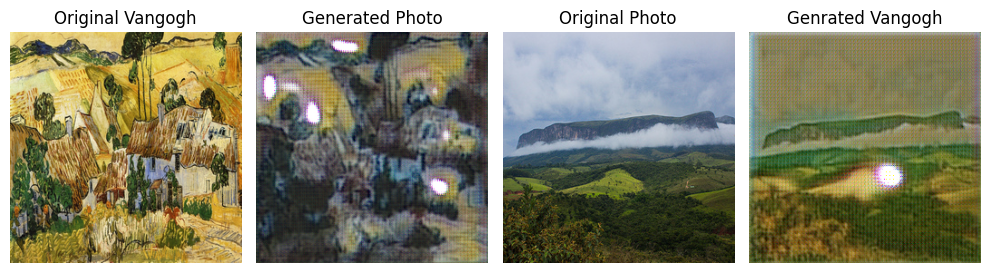

Epochs:  17%|███████████▎                                                        | 10/60 [2:08:20<10:40:07, 768.15s/it]

1/1 [==============================] - 0s 21ms/step


Epochs:  18%|████████████▍                                                       | 11/60 [2:21:11<10:27:49, 768.76s/it]

1/1 [==============================] - 0s 20ms/step


Epochs:  20%|█████████████▌                                                      | 12/60 [2:34:04<10:16:13, 770.29s/it]

1/1 [==============================] - 0s 21ms/step


Epochs:  22%|██████████████▋                                                     | 13/60 [2:46:59<10:04:19, 771.48s/it]

1/1 [==============================] - 0s 20ms/step


Epochs:  23%|████████████████                                                     | 14/60 [2:59:54<9:52:25, 772.73s/it]

1/1 [==============================] - 0s 21ms/step


Epochs:  25%|█████████████████▎                                                   | 15/60 [3:12:51<9:40:20, 773.79s/it]

1/1 [==============================] - 0s 21ms/step


Epochs:  27%|██████████████████▍                                                  | 16/60 [3:25:47<9:28:01, 774.57s/it]

1/1 [==============================] - 0s 21ms/step


Epochs:  28%|███████████████████▌                                                 | 17/60 [3:38:45<9:15:49, 775.57s/it]

1/1 [==============================] - 0s 22ms/step


Epochs:  30%|████████████████████▋                                                | 18/60 [3:51:44<9:03:39, 776.66s/it]

1/1 [==============================] - 0s 20ms/step


Epochs:  32%|█████████████████████▊                                               | 19/60 [4:04:45<8:51:36, 777.95s/it]

1/1 [==============================] - 0s 23ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


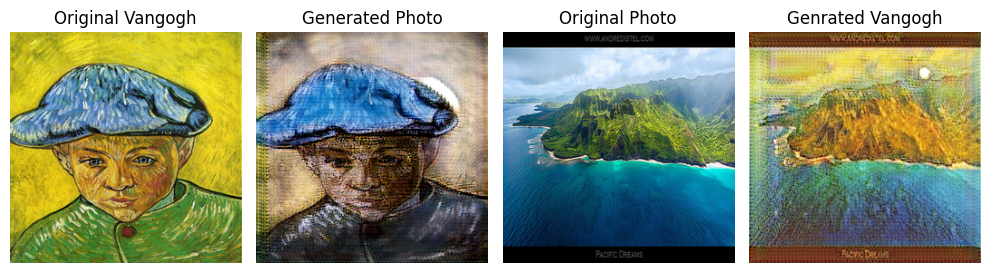

Epochs:  33%|███████████████████████                                              | 20/60 [4:17:49<8:39:49, 779.75s/it]

1/1 [==============================] - 0s 21ms/step


Epochs:  35%|████████████████████████▏                                            | 21/60 [4:30:52<8:27:33, 780.86s/it]

1/1 [==============================] - 0s 22ms/step


Epochs:  37%|█████████████████████████▎                                           | 22/60 [4:43:56<8:15:06, 781.76s/it]

1/1 [==============================] - 0s 23ms/step


Epochs:  38%|██████████████████████████▍                                          | 23/60 [4:57:02<8:02:46, 782.88s/it]

1/1 [==============================] - 0s 22ms/step


Epochs:  40%|███████████████████████████▌                                         | 24/60 [5:10:07<7:50:06, 783.52s/it]

1/1 [==============================] - 0s 25ms/step


Epochs:  42%|████████████████████████████▊                                        | 25/60 [5:23:15<7:37:57, 785.07s/it]

1/1 [==============================] - 0s 22ms/step


Epochs:  43%|█████████████████████████████▉                                       | 26/60 [5:36:25<7:25:38, 786.42s/it]

1/1 [==============================] - 0s 21ms/step


Epochs:  45%|███████████████████████████████                                      | 27/60 [5:49:35<7:13:03, 787.39s/it]

1/1 [==============================] - 0s 28ms/step


Epochs:  47%|████████████████████████████████▏                                    | 28/60 [6:02:47<7:00:45, 788.93s/it]

1/1 [==============================] - 0s 26ms/step


Epochs:  48%|█████████████████████████████████▎                                   | 29/60 [6:16:00<6:48:15, 790.19s/it]

1/1 [==============================] - 0s 21ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


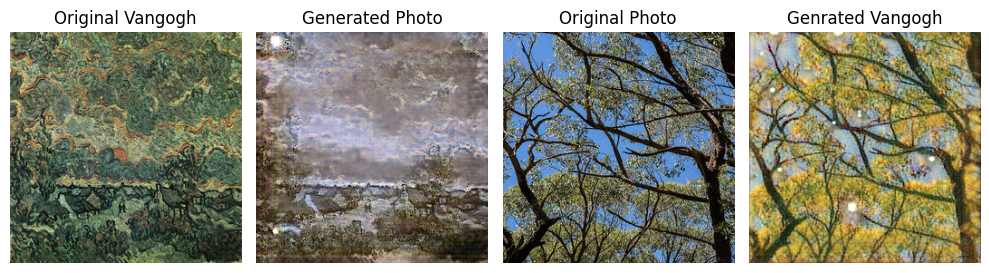

Epochs:  50%|██████████████████████████████████▌                                  | 30/60 [6:29:19<6:36:22, 792.74s/it]

1/1 [==============================] - 0s 21ms/step


Epochs:  52%|███████████████████████████████████▋                                 | 31/60 [6:42:36<6:23:45, 793.99s/it]

1/1 [==============================] - 0s 21ms/step


Epochs:  53%|████████████████████████████████████▊                                | 32/60 [6:55:57<6:11:28, 796.02s/it]

1/1 [==============================] - 0s 22ms/step


Epochs:  55%|█████████████████████████████████████▉                               | 33/60 [7:09:17<5:58:46, 797.29s/it]

1/1 [==============================] - 0s 22ms/step


Epochs:  57%|███████████████████████████████████████                              | 34/60 [7:22:41<5:46:23, 799.37s/it]

1/1 [==============================] - 0s 22ms/step


Epochs:  58%|████████████████████████████████████████▎                            | 35/60 [7:36:06<5:33:42, 800.90s/it]

1/1 [==============================] - 0s 25ms/step


Epochs:  60%|█████████████████████████████████████████▍                           | 36/60 [7:49:32<5:20:59, 802.50s/it]

1/1 [==============================] - 0s 25ms/step


Epochs:  62%|██████████████████████████████████████████▌                          | 37/60 [8:03:01<5:08:23, 804.51s/it]

1/1 [==============================] - 0s 21ms/step


Epochs:  63%|███████████████████████████████████████████▋                         | 38/60 [8:16:29<4:55:19, 805.43s/it]

1/1 [==============================] - 0s 26ms/step


Epochs:  65%|████████████████████████████████████████████▊                        | 39/60 [8:30:02<4:42:41, 807.70s/it]

1/1 [==============================] - 0s 38ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


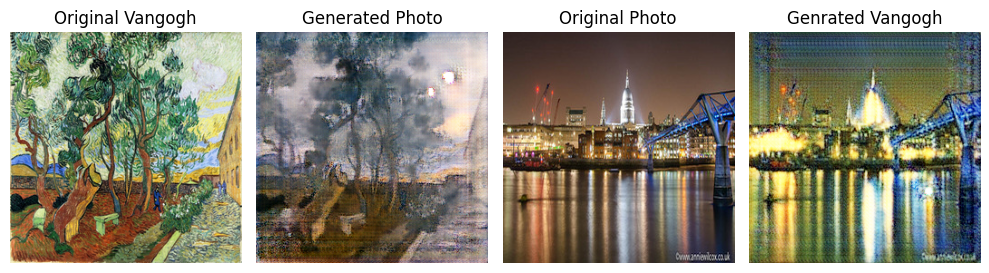

Epochs:  67%|██████████████████████████████████████████████                       | 40/60 [8:43:33<4:29:35, 808.77s/it]

1/1 [==============================] - 0s 29ms/step


Epochs:  68%|███████████████████████████████████████████████▏                     | 41/60 [8:57:10<4:16:52, 811.17s/it]

1/1 [==============================] - 0s 29ms/step


Epochs:  70%|████████████████████████████████████████████████▎                    | 42/60 [9:10:45<4:03:43, 812.39s/it]

1/1 [==============================] - 0s 28ms/step


Epochs:  72%|█████████████████████████████████████████████████▍                   | 43/60 [9:24:25<3:50:51, 814.78s/it]

1/1 [==============================] - 0s 22ms/step


Epochs:  73%|██████████████████████████████████████████████████▌                  | 44/60 [9:38:04<3:37:37, 816.12s/it]

1/1 [==============================] - 0s 25ms/step


Epochs:  75%|███████████████████████████████████████████████████▊                 | 45/60 [9:51:47<3:24:30, 818.06s/it]

1/1 [==============================] - 0s 23ms/step


Epochs:  77%|████████████████████████████████████████████████████▏               | 46/60 [10:05:33<3:11:25, 820.41s/it]

1/1 [==============================] - 0s 29ms/step


Epochs:  78%|█████████████████████████████████████████████████████▎              | 47/60 [10:19:17<2:58:00, 821.56s/it]

1/1 [==============================] - 0s 31ms/step


Epochs:  80%|██████████████████████████████████████████████████████▍             | 48/60 [10:33:09<2:44:55, 824.60s/it]

1/1 [==============================] - 0s 28ms/step


Epochs:  82%|███████████████████████████████████████████████████████▌            | 49/60 [10:47:03<2:31:43, 827.60s/it]

1/1 [==============================] - 0s 24ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


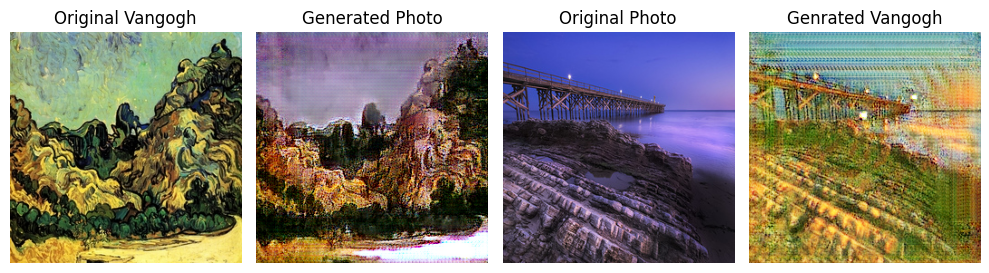

Epochs:  83%|████████████████████████████████████████████████████████▋           | 50/60 [11:01:16<2:19:09, 834.93s/it]

1/1 [==============================] - 0s 30ms/step


Epochs:  85%|█████████████████████████████████████████████████████████▊          | 51/60 [11:15:18<2:05:36, 837.34s/it]

1/1 [==============================] - 0s 30ms/step


Epochs:  87%|██████████████████████████████████████████████████████████▉         | 52/60 [11:29:21<1:51:51, 838.89s/it]

1/1 [==============================] - 0s 28ms/step


Epochs:  88%|████████████████████████████████████████████████████████████        | 53/60 [11:43:22<1:37:56, 839.57s/it]

1/1 [==============================] - 0s 40ms/step


Epochs:  90%|█████████████████████████████████████████████████████████████▏      | 54/60 [11:57:31<1:24:14, 842.46s/it]

1/1 [==============================] - 0s 27ms/step


Epochs:  92%|██████████████████████████████████████████████████████████████▎     | 55/60 [12:12:15<1:11:14, 854.89s/it]

1/1 [==============================] - 0s 29ms/step


Epochs:  93%|█████████████████████████████████████████████████████████████████▎    | 56/60 [12:26:15<56:41, 850.28s/it]

1/1 [==============================] - 0s 32ms/step


Epochs:  95%|██████████████████████████████████████████████████████████████████▌   | 57/60 [12:40:22<42:27, 849.32s/it]

1/1 [==============================] - 0s 27ms/step


Epochs:  97%|███████████████████████████████████████████████████████████████████▋  | 58/60 [12:54:25<28:14, 847.42s/it]

1/1 [==============================] - 0s 28ms/step


Epochs:  98%|████████████████████████████████████████████████████████████████████▊ | 59/60 [13:08:35<14:08, 848.32s/it]

1/1 [==============================] - 0s 31ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


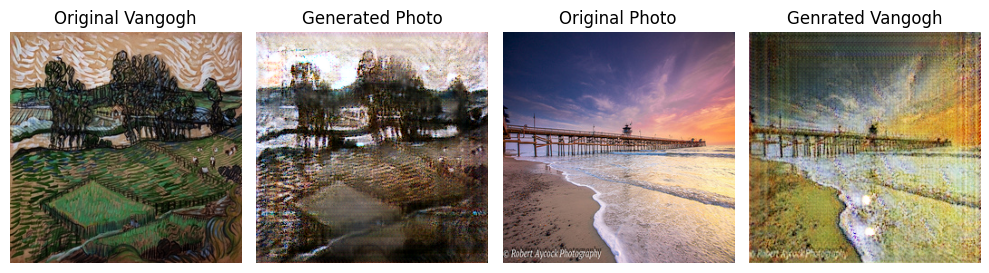

Epochs: 100%|██████████████████████████████████████████████████████████████████████| 60/60 [13:22:42<00:00, 802.71s/it]


In [20]:
train(d_A, d_B, g_AB, g_BA, c_AB, c_BA, epochs=60, chunk=10)

In [21]:
g_AB.save("GeneratorGtoP_60.h5")
g_BA.save("GeneratorPtoG_60.h5")

In [27]:
HtoZ_gen = load_model("C:/Users/IT/midas/GeneratorGtoP_60.h5")
ZtoH_gen = load_model("C:/Users/IT/midas/GeneratorPtoG_60.h5")

1/1 [==============================] - 0s 20ms/step


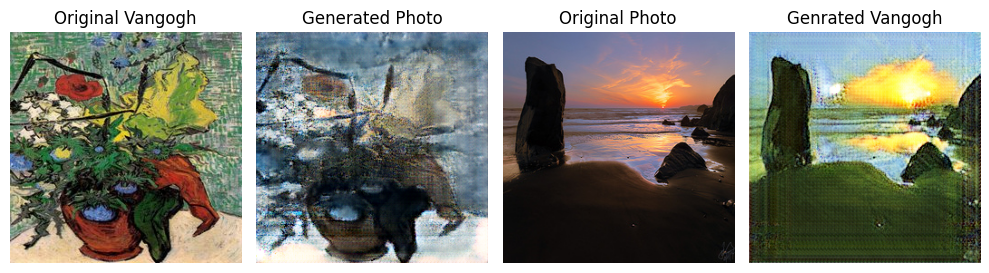

1/1 [==============================] - 0s 20ms/step


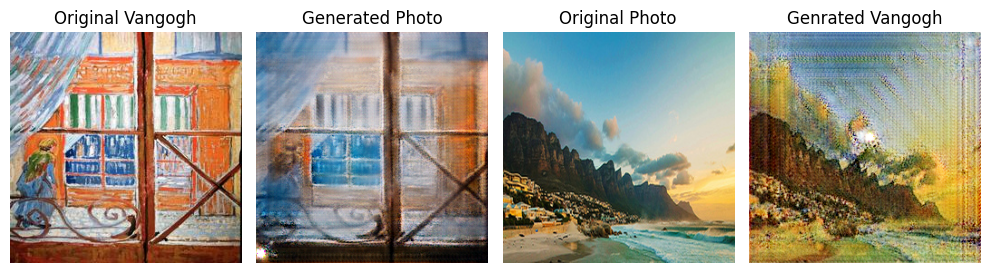

1/1 [==============================] - 0s 21ms/step


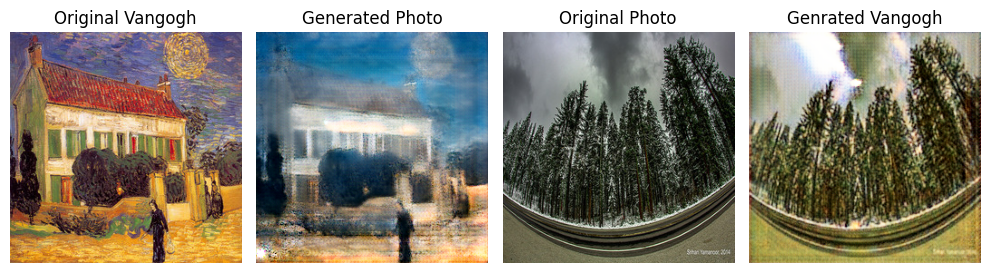

1/1 [==============================] - 0s 21ms/step


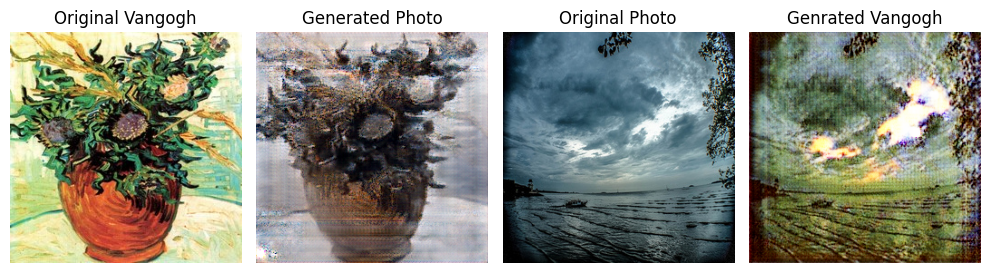

1/1 [==============================] - 0s 20ms/step


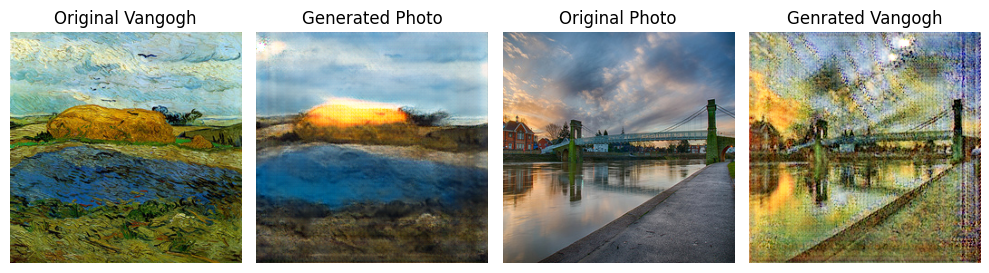

In [32]:
show_preds(HtoZ_gen, ZtoH_gen, n_images=5)

In [31]:
HtoZ_gen_25 = load_model("C:/Users/IT/midas/GeneratorMtoP_35.h5")
ZtoH_gen_25 = load_model("C:/Users/IT/midas/GeneratorPtoM_35.h5")

1/1 [==============================] - 0s 35ms/step


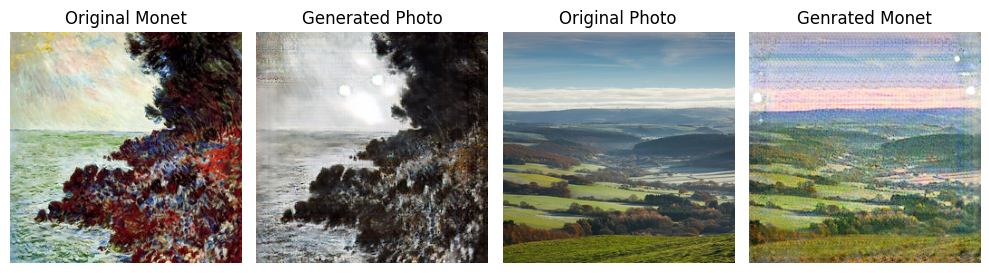

1/1 [==============================] - 0s 45ms/step


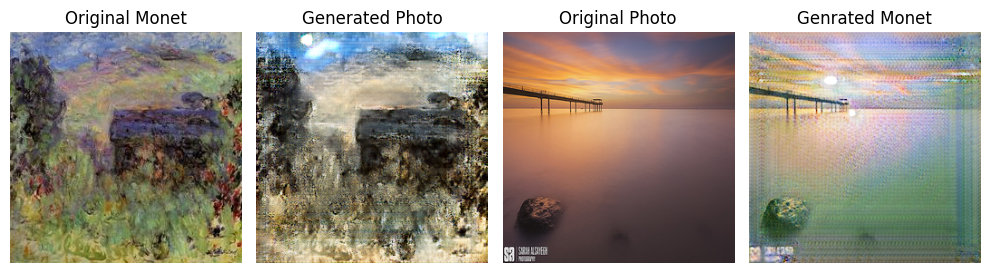

1/1 [==============================] - 0s 42ms/step


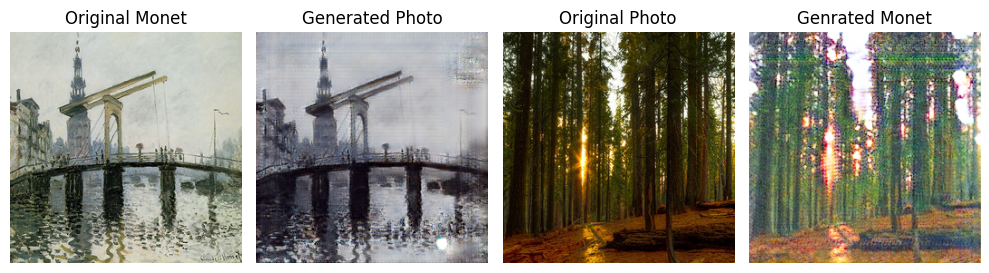

1/1 [==============================] - 0s 26ms/step


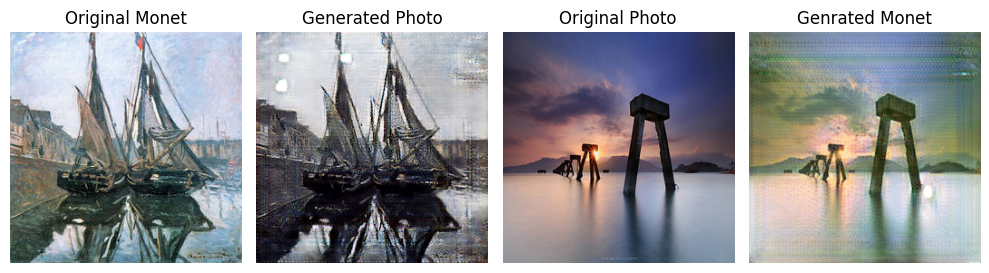

1/1 [==============================] - 0s 21ms/step


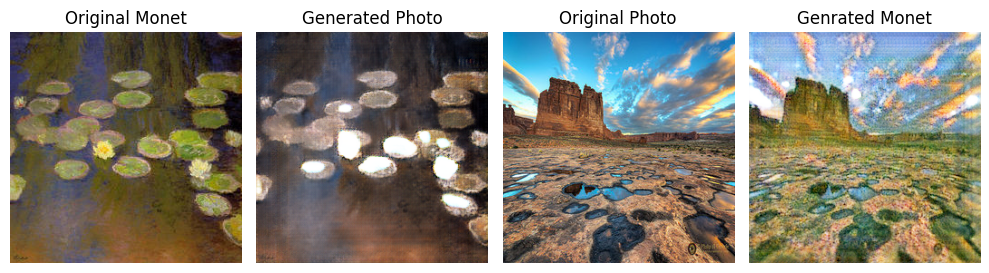

In [47]:
show_preds(HtoZ_gen_25, ZtoH_gen_25, n_images=5)